In [1]:
import xarray as xr
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import pyart
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.ticker import MultipleLocator
import sys
import glob

sys.path.append('/home/robbyfrost/Analysis/TurbTor_Radar/')
from functions import get_time_pyart
sys.path.append('/home/robbyfrost/Analysis/TurbTor_Lidar/')
from lidar_functions import *

# plotting set up
plt.rcParams['axes.labelweight'] = 'normal'
plt.rcParams['text.latex.preamble'] = r'\usepackage{bm}'
rc('font', family='sans-serif')
rc('font', weight='normal', size=15)
rc('figure', facecolor='white')


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
# lidar directory
dlid = "/data/arrcwx/robbyfrost/halo/20250425/cfrada/"
# lidar files
lfiles = sorted(glob.glob(f"{dlid}*"))

# read all lidar files
lid = [xr.open_dataset(f) for f in lfiles]

# array of median sweep times
ltdt = np.empty(len(lid), dtype="datetime64[ns]")
for jt, l in enumerate(lid):
    times = l["time"].values.astype("int64")
    ltdt[jt] = np.median(times).astype("datetime64[ns]")

### Tracking worm along OFB

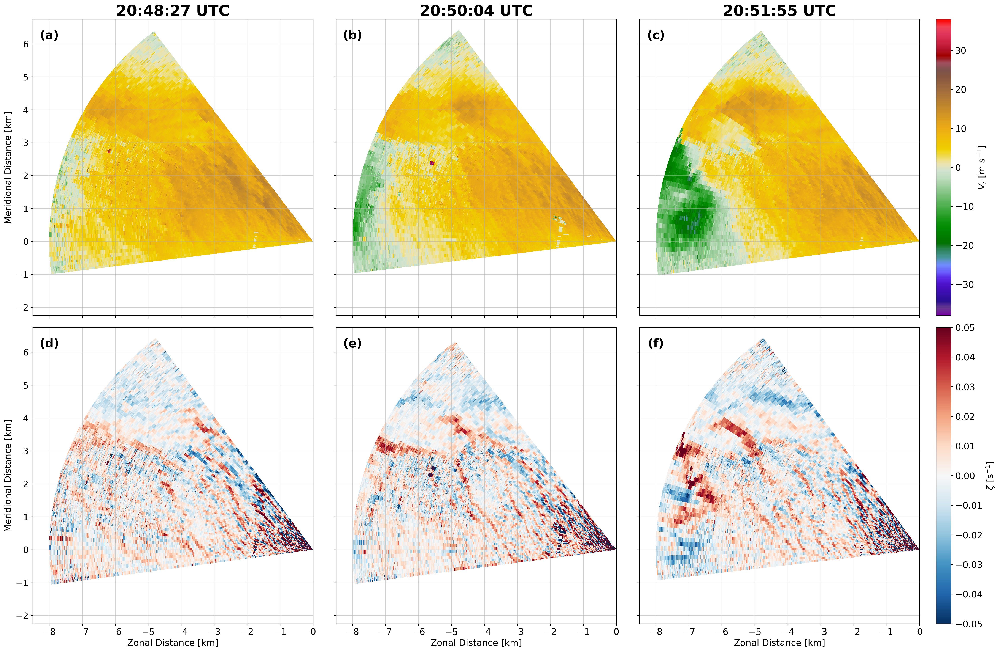

In [4]:
fig, axs = plt.subplots(
    figsize=(23,15),
    ncols=3,
    nrows=2,
    sharex=True,
    sharey=True,
    constrained_layout=True,
    dpi=200
)

xbds = [-8.5,0]
ybds = [-2.25,6.75]

for i, jt in enumerate([2,5,8]):
    # column index
    cidx = i

    # truncate lidar sweep
    l = lid[jt]
    # convert time to python datetime
    ldt = pd.Timestamp(ltdt[jt]).to_pydatetime()
    ldt = ldt.replace(microsecond=0)
    # arrays
    r = l.range.values * 1e3
    az = l.azimuth.values
    vr = l.vr.values
    el = l.elevation.values
    # calculate vorticity
    vort = ((vr[2:,:]-vr[:-2,:]) / ((np.deg2rad(az[2:])-np.deg2rad(az[:-2]))[:,None])) / (r[None,:])
    # lidar cartesian grid points
    lx, ly = dis_angle_to_2Dxy(
        beam_range_2D(r/1e3, el)[0][:,0] * 1e3,
        north0_to_arctheta(az)
        )
        
    # shade velocity
    ax = axs[0,cidx]
    ax.set_title(f"{ldt.time()} UTC", fontsize=25, fontweight='bold')
    vmin, vmax = -38, 38
    pcmv = ax.pcolormesh(
        lx.T/1e3,
        ly.T/1e3,
        vr,
        vmin=vmin,
        vmax=vmax,
        cmap='Carbone42'
    )
    # shade vorticity
    ax = axs[1,cidx]
    zmin, zmax = -0.05, 0.05
    pcmz = ax.pcolormesh(
        lx.T[1:-1,:]/1e3,
        ly.T[1:-1,:]/1e3,
        vort,
        vmin=zmin,
        vmax=zmax,
        cmap='RdBu_r'
    )

# colorbars
cbar = fig.colorbar(pcmv, ax=axs[0,:], pad=0.015, label="$V_r$ [m s$^{-1}$]", orientation='vertical')
cbar.set_ticks(np.arange(-30, 30.01, 10))
cbar = fig.colorbar(pcmz, ax=axs[1,:], pad=0.015, label="$\\zeta$ [s$^{-1}$]", orientation='vertical')
cbar.set_ticks(np.arange(zmin, zmax+1e-5, 0.01))

# clean up plot
labs = "abcdef"
for i, ax in enumerate(axs.flatten()):
    ax.text(
        x=xbds[0]+0.5, 
        y=ybds[1]-0.5, 
        s=f"({labs[i]})", 
        ha='center', 
        va='center', 
        fontweight='bold',
        fontsize=20
        )
    ax.set_aspect('equal')
    ax.set_xlim(xbds)
    ax.set_ylim(ybds)
    ax.grid(alpha=0.6)
for ax in axs[1,:]:
    ax.set_xlabel("Zonal Distance [km]")
for ax in axs[:,0]:
    ax.set_ylabel("Meridional Distance [km]")

### Tracking worm/vortex intensification

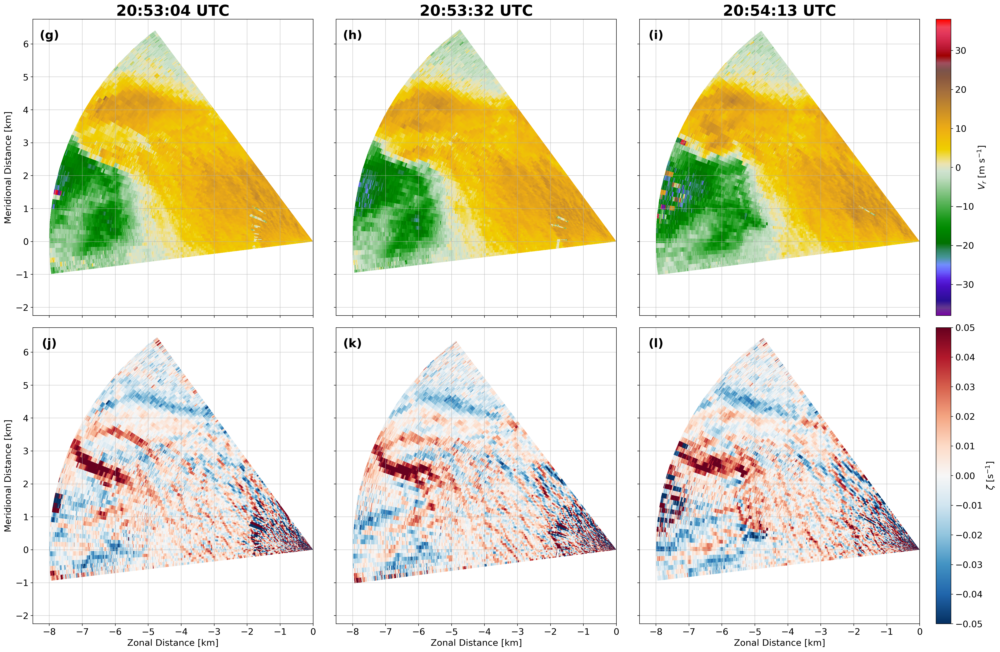

In [10]:
fig, axs = plt.subplots(
    figsize=(23,15),
    ncols=3,
    nrows=2,
    sharex=True,
    sharey=True,
    constrained_layout=True,
    dpi=200
)

xbds = [-8.5,0]
ybds = [-2.25,6.75]

for i, jt in enumerate([10,11,12]):
    # column index
    cidx = i

    # truncate lidar sweep
    l = lid[jt]
    # convert time to python datetime
    ldt = pd.Timestamp(ltdt[jt]).to_pydatetime()
    ldt = ldt.replace(microsecond=0)
    # arrays
    r = l.range.values * 1e3
    az = l.azimuth.values
    vr = l.vr.values
    el = l.elevation.values
    # calculate vorticity
    vort = ((vr[2:,:]-vr[:-2,:]) / ((np.deg2rad(az[2:])-np.deg2rad(az[:-2]))[:,None])) / (r[None,:])
    # lidar cartesian grid points
    lx, ly = dis_angle_to_2Dxy(
        beam_range_2D(r/1e3, el)[0][:,0] * 1e3,
        north0_to_arctheta(az)
        )
        
    # shade velocity
    ax = axs[0,cidx]
    ax.set_title(f"{ldt.time()} UTC", fontsize=25, fontweight='bold')
    vmin, vmax = -38, 38
    pcmv = ax.pcolormesh(
        lx.T/1e3,
        ly.T/1e3,
        vr,
        vmin=vmin,
        vmax=vmax,
        cmap='Carbone42'
    )
    # shade vorticity
    ax = axs[1,cidx]
    zmin, zmax = -0.05, 0.05
    pcmz = ax.pcolormesh(
        lx.T[1:-1,:]/1e3,
        ly.T[1:-1,:]/1e3,
        vort,
        vmin=zmin,
        vmax=zmax,
        cmap='RdBu_r'
    )

# colorbars
cbar = fig.colorbar(pcmv, ax=axs[0,:], pad=0.015, label="$V_r$ [m s$^{-1}$]", orientation='vertical')
cbar.set_ticks(np.arange(-30, 30.01, 10))
cbar = fig.colorbar(pcmz, ax=axs[1,:], pad=0.015, label="$\\zeta$ [s$^{-1}$]", orientation='vertical')
cbar.set_ticks(np.arange(zmin, zmax+1e-5, 0.01))

# clean up plot
labs = "ghijkl"
for i, ax in enumerate(axs.flatten()):
    ax.text(
        x=xbds[0]+0.5, 
        y=ybds[1]-0.5, 
        s=f"({labs[i]})", 
        ha='center', 
        va='center', 
        fontweight='bold',
        fontsize=20
        )
    ax.set_aspect('equal')
    ax.set_xlim(xbds)
    ax.set_ylim(ybds)
    ax.grid(alpha=0.6)
for ax in axs[1,:]:
    ax.set_xlabel("Zonal Distance [km]")
for ax in axs[:,0]:
    ax.set_ylabel("Meridional Distance [km]")

### Tornado intensification

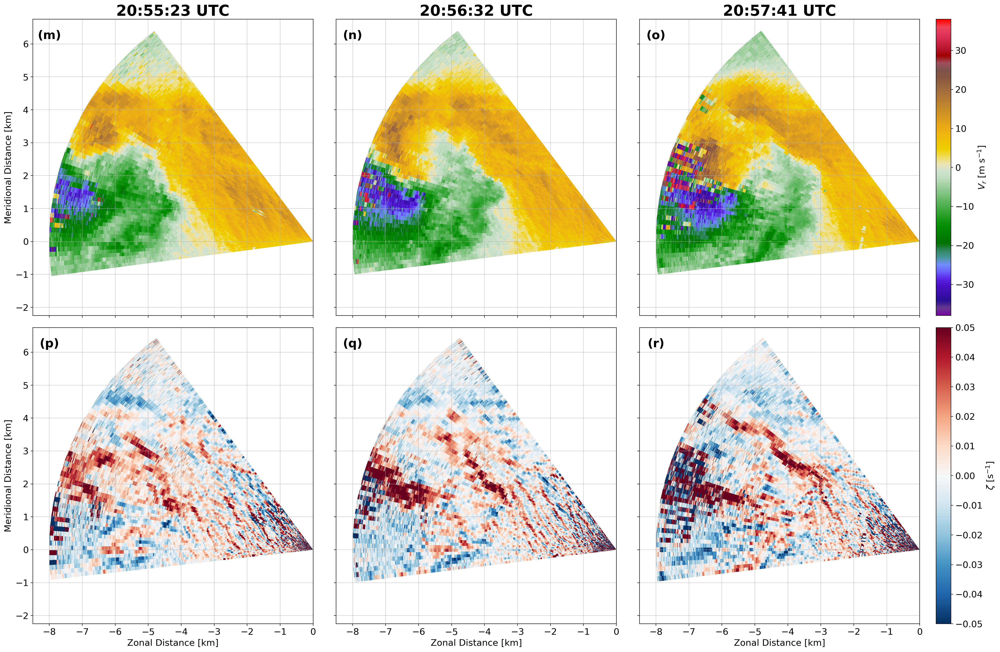

In [12]:
fig, axs = plt.subplots(
    figsize=(23,15),
    ncols=3,
    nrows=2,
    sharex=True,
    sharey=True,
    constrained_layout=True,
    dpi=200
)

xbds = [-8.5,0]
ybds = [-2.25,6.75]

for i, jt in enumerate([14,16,18]):
    # column index
    cidx = i

    # truncate lidar sweep
    l = lid[jt]
    # convert time to python datetime
    ldt = pd.Timestamp(ltdt[jt]).to_pydatetime()
    ldt = ldt.replace(microsecond=0)
    # arrays
    r = l.range.values * 1e3
    az = l.azimuth.values
    vr = l.vr.values
    el = l.elevation.values
    # calculate vorticity
    vort = ((vr[2:,:]-vr[:-2,:]) / ((np.deg2rad(az[2:])-np.deg2rad(az[:-2]))[:,None])) / (r[None,:])
    # lidar cartesian grid points
    lx, ly = dis_angle_to_2Dxy(
        beam_range_2D(r/1e3, el)[0][:,0] * 1e3,
        north0_to_arctheta(az)
        )
        
    # shade velocity
    ax = axs[0,cidx]
    ax.set_title(f"{ldt.time()} UTC", fontsize=25, fontweight='bold')
    vmin, vmax = -38, 38
    pcmv = ax.pcolormesh(
        lx.T/1e3,
        ly.T/1e3,
        vr,
        vmin=vmin,
        vmax=vmax,
        cmap='Carbone42'
    )
    # shade vorticity
    ax = axs[1,cidx]
    zmin, zmax = -0.05, 0.05
    pcmz = ax.pcolormesh(
        lx.T[1:-1,:]/1e3,
        ly.T[1:-1,:]/1e3,
        vort,
        vmin=zmin,
        vmax=zmax,
        cmap='RdBu_r'
    )

# colorbars
cbar = fig.colorbar(pcmv, ax=axs[0,:], pad=0.015, label="$V_r$ [m s$^{-1}$]", orientation='vertical')
cbar.set_ticks(np.arange(-30, 30.01, 10))
cbar = fig.colorbar(pcmz, ax=axs[1,:], pad=0.015, label="$\\zeta$ [s$^{-1}$]", orientation='vertical')
cbar.set_ticks(np.arange(zmin, zmax+1e-5, 0.01))

# clean up plot
labs = "mnopqr"
for i, ax in enumerate(axs.flatten()):
    ax.text(
        x=xbds[0]+0.5, 
        y=ybds[1]-0.5, 
        s=f"({labs[i]})", 
        ha='center', 
        va='center', 
        fontweight='bold',
        fontsize=20
        )
    ax.set_aspect('equal')
    ax.set_xlim(xbds)
    ax.set_ylim(ybds)
    ax.grid(alpha=0.6)
for ax in axs[1,:]:
    ax.set_xlabel("Zonal Distance [km]")
for ax in axs[:,0]:
    ax.set_ylabel("Meridional Distance [km]")